# MSCA 32018
# Natural Language Processing
## Final Project
## Casey Ellis
### 08/21/2021

# Summary

Illinois is famous for being one of the very few states in the country with negative population growth.  The objective of your final project is to:

1. Identify the key reasons for the declining population by extracting meaningful insights from unstructured text
2. Provide actionable recommendations on what can be done to reverse this trend


# Methodology 

After eliminating articles that are not relavent, detect a general sentiment in each artice. Use topic modeling with negative sentiment articles to determine patterns causing flight from the state, and positive sentiment articles to determine factors attracting residents and businesses. Then create recommendations based on the identified topics. 


# Code

## Setup and Data Cleaning 

In [180]:
# Base
import os
import re
import string
import math
import time 

# Data Structures
import pandas as pd
import numpy as np

# Plotting
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

# NLP
from textblob import TextBlob
import nltk as nltk
from nltk.corpus import stopwords
from nltk.stem.wordnet import WordNetLemmatizer

# Sentiment
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import CountVectorizer, HashingVectorizer, TfidfTransformer, TfidfVectorizer
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import make_pipeline
from sklearn import metrics
from joblib import dump, load

# Topic Modeling
from gensim import corpora, models
from gensim.models.ldamulticore import LdaMulticore
from gensim.models import CoherenceModel
import pyLDAvis
import pyLDAvis.gensim_models 

import pickle
import joblib

In [169]:
import multiprocessing

num_processors = multiprocessing.cpu_count()

## Data Cleaning

In [2]:
df = pd.read_json('news_chicago_il.json', encoding ='UTF-8', lines = True)
df.head()

,crawled_date,language,text,title
0,1623283200000,english,Fill in your details below or click an icon to...,Howard Majors—Chicago (1913)
1,1623283200000,english,Chicago Woman Warns Others After Car She Purch...,Chicago Woman Warns Others After Car She Purch...
2,1623283200000,english,Moon Alert Caution! Avoid shopping or making i...,"Horoscope for Thursday, June 10, 2021 - Chicag..."
3,1623283200000,english,Illinois State Tax Chart - Sales Tax Chart Ill...,illinois state tax chart
4,1623283200000,english,Illinois State Budget Pie Chart - Heres Where ...,illinois state budget pie chart


In [4]:
df.text[1]

'Chicago Woman Warns Others After Car She Purchased Online Was Reported Stolen – NBC Chicago » Scammer News June 10, 2021 1\nA mother of seven from Chicago’s South Side saved up thousands of dollars to purchase a used car online thinking she got a good deal, but months later police showed up at her front door saying the car was reported stolen.\nNow, Latoya Maxwell is putting on a brave face for her kids, but said deep down she is struggling.\n“It’s rough, like we’re going through a hard time right now,” she said. “I don’t like crying in front of my kids.”\nThe mother of seven is now out $3,500 and a car after she said she was scammed online.\n“Well, it’s a lot of heartache behind it because it ain’t like I’m getting this money off scheming,” said Maxwell. “I work for my money. I work hard for my money.”\nMaxwell told NBC 5 she saved up money to purchase a used car for her family. She spent months researching and thought she was getting a good deal after seeing a listing through an onl

In [5]:
#Making sure all articles are in english
df['language'].unique()

array(['english'], dtype=object)

In [6]:
#Removing punctuation
df['text'] = df['text'].map(lambda x: re.sub('[^a-zA-Z0-9 @ . , : - _]', '', str(x)))
df['title'] = df['title'].map(lambda x: re.sub('[^a-zA-Z0-9 @ . , : - _]', '', str(x)))

## Topic Modeling 1
### TF-IDF for general topics

In [8]:
bloblist = []
del bloblist[:]

for i in range(0,len(df)):
    bloblist.append(TextBlob(df['text'].iloc[i]))
    
len(bloblist) 

439835

In [9]:
def tf(word, blob):
    return blob.words.count(word) / len(blob.words)
def n_containing(word, bloblist):
    return sum(1 for blob in bloblist if word in blob.words)
def idf(word, bloblist):
    return math.log(len(bloblist) / (1 + n_containing(word, bloblist)))

def tfidf(word, blob, bloblist):
    return tf(word, blob) * idf(word, bloblist)

In [10]:
news_list = df['text'].tolist()
news_list[:1]

['Fill in your details below or click an icon to log in: Email required Address never made public Name required You are commenting using your WordPress.com account.  Log Out  Change  You are commenting using your Google account.  Log Out  Change  You are commenting using your Twitter account.  Log Out  Change  You are commenting using your Facebook account.  Log Out  Change ']

In [11]:
stop = set(stopwords.words('english'))
exclude = set(string.punctuation)
lemma = WordNetLemmatizer()
def clean(doc):
    stop_free = " ".join([i for i in doc.lower().split() if i not in stop])
    punc_free = ''.join(ch for ch in stop_free if ch not in exclude)
    normalized = " ".join(lemma.lemmatize(word) for word in punc_free.split())
    return normalized


In [12]:
news_clean = [clean(doc).split() for doc in news_list]

In [13]:
len(news_clean)

439835

In [14]:
print(*news_clean[:1], sep='\n\n')

['fill', 'detail', 'click', 'icon', 'log', 'in', 'email', 'required', 'address', 'never', 'made', 'public', 'name', 'required', 'commenting', 'using', 'wordpresscom', 'account', 'log', 'change', 'commenting', 'using', 'google', 'account', 'log', 'change', 'commenting', 'using', 'twitter', 'account', 'log', 'change', 'commenting', 'using', 'facebook', 'account', 'log', 'change']


In [15]:
dictionary = corpora.Dictionary(news_clean)
%time doc_term_matrix = [dictionary.doc2bow(doc) for doc in news_clean]

Wall time: 2min 51s


In [16]:
%%time

num_topics = 7
iterations = 100
passes = 20
workers = num_processors-1
eval_every = None

ldamodel = LdaMulticore(corpus=doc_term_matrix,
                       id2word=dictionary,
                       eta='auto',
                       num_topics=num_topics,
                       iterations=iterations,
                       passes=passes,
                       eval_every=eval_every,
                       workers = workers)

Wall time: 1h 38min 34s


In [17]:
print(*ldamodel.print_topics(num_topics=num_topics, num_words=7), sep='\n\n')

(0, '0.013*"chicago" + 0.006*"also" + 0.005*"roof" + 0.005*"roofing" + 0.005*"time" + 0.005*"get" + 0.004*"one"')

(1, '0.011*"illinois" + 0.009*"service" + 0.009*"credit" + 0.008*"loan" + 0.007*"company" + 0.006*"business" + 0.005*"debt"')

(2, '0.073*"school" + 0.071*"district" + 0.039*"community" + 0.028*"unit" + 0.020*"share" + 0.014*"company" + 0.014*"stock"')

(3, '0.011*"said" + 0.010*"illinois" + 0.008*"state" + 0.006*"would" + 0.006*"year" + 0.005*"chicago" + 0.005*"people"')

(4, '0.013*"game" + 0.010*"chicago" + 0.009*"season" + 0.008*"team" + 0.006*"first" + 0.006*"point" + 0.005*"last"')

(5, '0.015*"illinois" + 0.012*"state" + 0.012*"covid19" + 0.012*"county" + 0.010*"health" + 0.009*"said" + 0.009*"1"')

(6, '0.024*"chicago" + 0.016*"police" + 0.011*"said" + 0.008*"officer" + 0.007*"shot" + 0.005*"shooting" + 0.005*"man"')


## Sentiment Analysis
### Training on Yelp reviews

In [187]:
yelp_path = 'yelp_train_sentiment.json'
yelp = pd.read_json(yelp_path, lines=True)
pd.set_option('display.max_colwidth', 200)

In [188]:
X = yelp['text']
y = yelp['label']

print(f"X Shape: {X.shape}")
print(f"y Shape: {y.shape}")

X Shape: (255717,)
y Shape: (255717,)


In [189]:
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)

print(f"Training records, X_train: {X_train.shape} y_train: {y_train.shape}")
print(f"Testing records, X_test: {X_test.shape} y_test: {y_test.shape}")

Training records, X_train: (191787,) y_train: (191787,)
Testing records, X_test: (63930,) y_test: (63930,)


In [190]:
vect = CountVectorizer(lowercase=False, stop_words='english', ngram_range=(1,3))

#### Using a logistic regression model

In [42]:
logreg = LogisticRegression(max_iter=200)
%time logreg.fit(vect.fit_transform(X_train), y_train)

Wall time: 1h 1min 56s


LogisticRegression(max_iter=200)

In [43]:
y_pred = logreg.predict(vect.transform(X_test))

In [44]:
print(f"Test Accuracy: {metrics.accuracy_score(y_test, y_pred) * 100:.1f}%")
print(classification_report(y_test, y_pred))

Test Accuracy: 97.2%
              precision    recall  f1-score   support

           0       0.97      0.97      0.97     32003
           1       0.97      0.97      0.97     31927

    accuracy                           0.97     63930
   macro avg       0.97      0.97      0.97     63930
weighted avg       0.97      0.97      0.97     63930



In [194]:
pipe = make_pipeline(
    vect,
    logreg
)

In [49]:
y_pred = pipe.predict(X_test)

In [50]:
news_sent = pipe.predict(df['text']+df['title'])

In [52]:
df['sentiment']=news_sent

In [15]:
stop = set(stopwords.words('english'))
lemma = WordNetLemmatizer()
exclude = set(string.punctuation)

def clean(doc):
    stop_free = " ".join([i for i in doc.lower().split() if i not in stop])
    punc_free = ''.join(ch for ch in stop_free if ch not in exclude)
    normalized = " ".join(lemma.lemmatize(word) for word in punc_free.split())
    return normalized

In [86]:
df['text_cln'] = [clean(doc).split() for doc in df.text.to_list()]

Removing text <100 words to exclude fragments and captions

In [17]:
df = df[df['text_cln'].apply(lambda x: len(x) < 100)]

#### Saving the sentiment model and dataset so it doesn't have to be rerun

In [57]:
#df.to_pickle('sentiment_df.pkl')
#joblib.dump(logreg 'sentiment_model.sav')

In [ ]:
df = pd.read_pickle("sentiment_df.pkl")

In [182]:
logreg = joblib.load('sentiment_model.sav')

In [4]:
pos = df[df.sentiment == 1]
neg = df[df.sentiment == 0]

In [5]:
len(pos)

68130

In [6]:
len(neg)

109102

In [8]:
text_pos = pos.text_cln.values
text_neg = neg.text_cln.values

In [192]:
from wordcloud import WordCloud

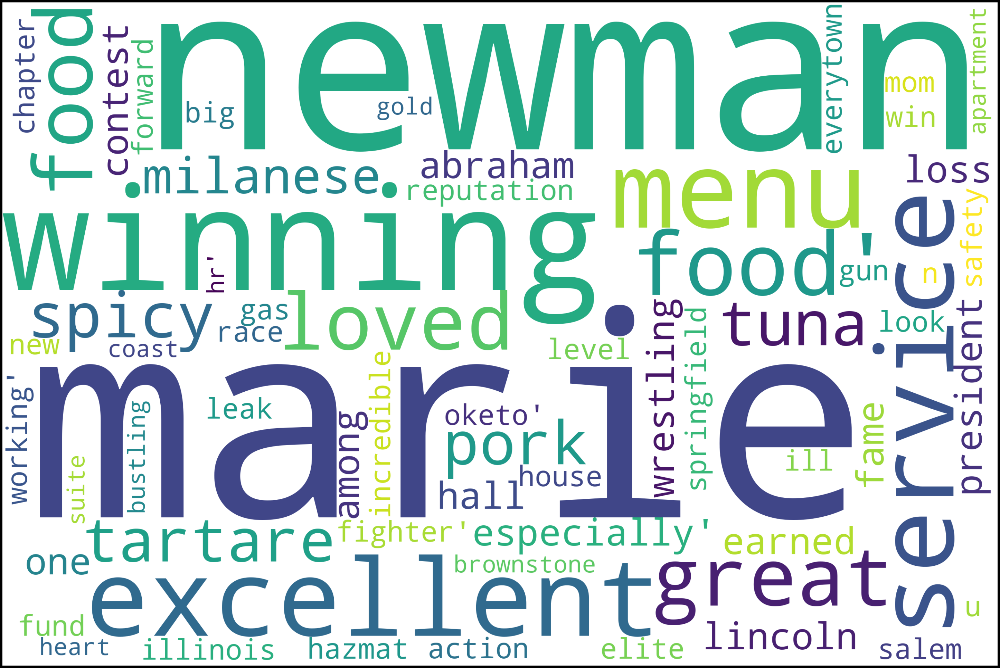

In [39]:
from wordcloud import WordCloud, STOPWORDS
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'white',
    stopwords = STOPWORDS).generate(str(text_pos))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

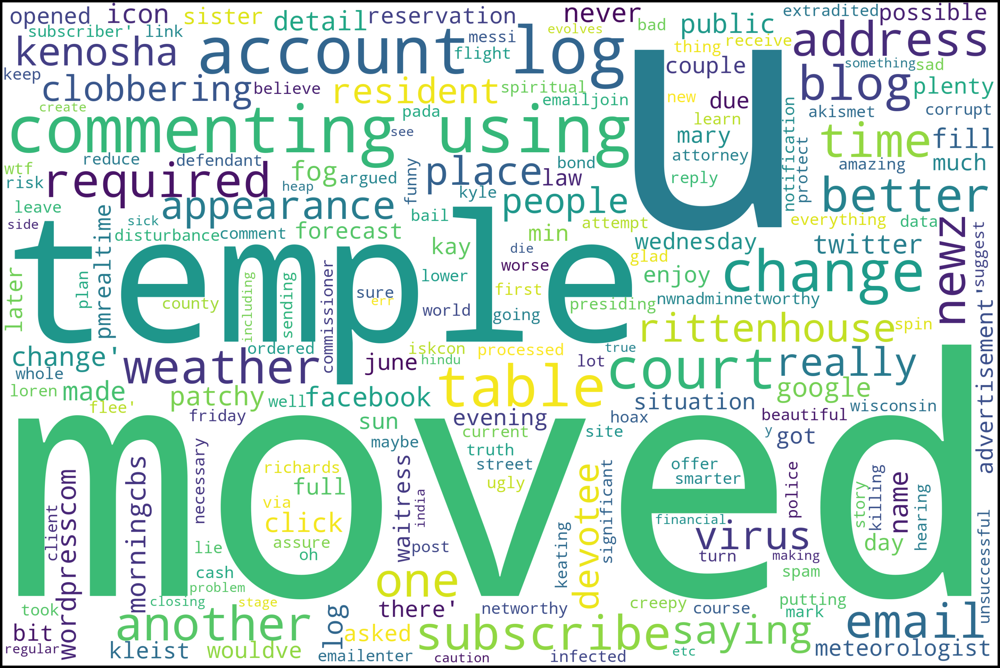

In [40]:
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'white',
    stopwords = STOPWORDS).generate(str(text_neg))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

## Topic Modeling
### For sentiment-specific topics 

In [108]:
pos_list = pos['text_cln'].tolist()
neg_list = neg['text_cln'].toligst()

In [114]:
pos_clean = [clean(doc).split() for doc in pos_list]
neg_clean = [clean(doc).split() for doc in neg_list]

In [116]:
pos_text_dict  = corpora.Dictionary(pos_clean)
neg_text_dict  = corpora.Dictionary(neg_clean)

In [119]:
%time pos_matrix = [pos_text_dict.doc2bow(doc) for doc in pos_clean]
%time neg_matrix = [neg_text_dict.doc2bow(doc) for doc in neg_clean]

Wall time: 2.43 s
Wall time: 2.85 s


In [122]:
max_topics = 10
n_topics = []

pos_lda_models = []
neg_lda_models = []

for i in range(1, max_topics):
    n_topics.append(i+1)
    %time pos_model = LdaMulticore(pos_matrix, num_topics=i+1, id2word = pos_text_dict, passes=10)
    %time neg_model = LdaMulticore(neg_matrix, num_topics=i+1, id2word = neg_text_dict, passes=10)
    pos_lda_models.append(pos_model)
    neg_lda_models.append(neg_model)

Wall time: 1min 6s
Wall time: 2min 7s
Wall time: 1min 36s
Wall time: 2min 22s
Wall time: 1min 33s
Wall time: 6min
Wall time: 1min 40s
Wall time: 2min 43s
Wall time: 8min 3s
Wall time: 12min 40s
Wall time: 1min 34s
Wall time: 2min 44s
Wall time: 1min 39s
Wall time: 4min 35s
Wall time: 1min 32s
Wall time: 2min 54s
Wall time: 1min 39s
Wall time: 2min 52s


In [126]:
pos_lda_models[4-2].print_topics()

[(0,
  '0.007*"great" + 0.006*"food" + 0.006*"service" + 0.005*"time" + 0.004*"good" + 0.004*"one" + 0.004*"best" + 0.004*"like" + 0.004*"new" + 0.004*"chicago"'),
 (1,
  '0.078*"associated" + 0.078*"press" + 0.075*"provided" + 0.075*"vote" + 0.041*"result" + 0.040*"early" + 0.039*"return" + 0.038*"past" + 0.038*"advance" + 0.038*"cast"'),
 (2,
  '0.018*"photo" + 0.015*"flickr" + 0.009*"point" + 0.008*"uploaded" + 0.008*"explore" + 0.007*"game" + 0.006*"season" + 0.006*"news" + 0.005*"2" + 0.005*"team"'),
 (3,
  '0.008*"1" + 0.007*"district" + 0.007*"2021" + 0.007*"u" + 0.006*"new" + 0.005*"news" + 0.005*"chicago" + 0.005*"2020" + 0.004*"city" + 0.004*"court"')]

In [127]:
neg_lda_models[4-2].print_topics()

[(0,
  '0.040*"department" + 0.038*"working" + 0.027*"employee" + 0.026*"pay" + 0.025*"public" + 0.022*"2019" + 0.022*"correction" + 0.019*"100" + 0.019*"data" + 0.019*"highest"'),
 (1,
  '0.019*"real" + 0.019*"estate" + 0.018*"broker" + 0.014*"information" + 0.013*"covid19" + 0.013*"data" + 0.012*"case" + 0.011*"logo" + 0.011*"mred" + 0.011*"reciprocity"'),
 (2,
  '0.015*"police" + 0.008*"shot" + 0.006*"say" + 0.005*"shooting" + 0.005*"officer" + 0.005*"man" + 0.005*"news" + 0.005*"people" + 0.004*"two" + 0.004*"1"'),
 (3,
  '0.007*"2021" + 0.004*"2" + 0.004*"1" + 0.004*"new" + 0.003*"time" + 0.003*"day" + 0.003*"u" + 0.003*"news" + 0.003*"chicago" + 0.003*"like"')]

### Entity recognition

In [12]:
import nltk as nltk
import nltk.corpus  
from nltk.text import Text
import re
import sys

#### Find positive entities 

In [141]:
pos_entities = []
pos_labels = []
pos_text = []
pers_list = []
org_list = []

In [143]:
for i in tqdm(pos.index,desc='outer'):
    org_ch = False
    pers_ch = False
    org = False
    pers = False
    text = pos['text'][i]
    for chunk in nltk.ne_chunk(nltk.pos_tag(nltk.word_tokenize(text)), binary = False):
        if hasattr(chunk, 'label'):
            if chunk.label() == 'PERSON':
                pers_ch = True
            if chunk.label() == 'ORGANIZATION':
                org_ch = True
            pos_entities.append(' '.join(c[0] for c in chunk))
            pos_labels.append(chunk.label())
            pos_text.append(pos['text'][i])
        if pers_ch:
            pers = True
        if org_ch:
            org = True
    if pers:
        pers_list.append(text)
    if org:
        org_list.append(text)

entities_labels = list(set(zip(pos_entities, pos_labels))) #unique entities

In [149]:
df_pos_all2 = pd.DataFrame({'Entities':pos_entities,'Labels':pos_labels, 'Text':pos_text})
df_pos_all2.head(20)

,Entities,Labels,Text
0,Great,GPE,Great food Loved the Spicy Tuna Tartare and th...
1,Spicy Tuna Tartare,ORGANIZATION,Great food Loved the Spicy Tuna Tartare and th...
2,Pork Milanese,ORGANIZATION,Great food Loved the Spicy Tuna Tartare and th...
3,Abraham,PERSON,Abraham Lincoln is in the wrestling hall of fa...
4,Lincoln,PERSON,Abraham Lincoln is in the wrestling hall of fa...
5,New Salem,GPE,Abraham Lincoln is in the wrestling hall of fa...
6,Illinois,GPE,Abraham Lincoln is in the wrestling hall of fa...
7,Great,GPE,Great selection of pizzas as well as other Ita...
8,Italian,GPE,Great selection of pizzas as well as other Ita...
9,Ambiance,GPE,Ambiance is breathtaking


In [150]:
df_pos_all = pd.DataFrame({'Entities':pos_entities,'Labels':pos_labels, 'Text':pos_text})
df_pos_all.head(20)

,Entities,Labels,Text
0,Great,GPE,Great food Loved the Spicy Tuna Tartare and th...
1,Spicy Tuna Tartare,ORGANIZATION,Great food Loved the Spicy Tuna Tartare and th...
2,Pork Milanese,ORGANIZATION,Great food Loved the Spicy Tuna Tartare and th...
3,Abraham,PERSON,Abraham Lincoln is in the wrestling hall of fa...
4,Lincoln,PERSON,Abraham Lincoln is in the wrestling hall of fa...
5,New Salem,GPE,Abraham Lincoln is in the wrestling hall of fa...
6,Illinois,GPE,Abraham Lincoln is in the wrestling hall of fa...
7,Great,GPE,Great selection of pizzas as well as other Ita...
8,Italian,GPE,Great selection of pizzas as well as other Ita...
9,Ambiance,GPE,Ambiance is breathtaking


In [65]:
df_pos_org = df_pos_all[df_pos_all['Labels'] == 'ORGANIZATION']
df_pos_org.head(20)

,Entities,Labels
1,Spicy Tuna Tartare,ORGANIZATION
2,Pork Milanese,ORGANIZATION
12,BBB,ORGANIZATION
15,CDC,ORGANIZATION
18,COVID,ORGANIZATION
20,Formentos,ORGANIZATION
23,McGuire,ORGANIZATION
33,Tellez,ORGANIZATION
34,Moncada,ORGANIZATION
35,Madrigal,ORGANIZATION


In [66]:
from collections import Counter
c = Counter()
for ent in df_pos_org['Entities']:
    c[ent]+=1

In [67]:
pd.DataFrame.from_dict(c.most_common(20))

,0,1
0,Associated Press,18136
1,Chicago,2114
2,COVID19,1217
3,District Court,1094
4,CHICAGO,1091
5,University,1009
6,AP,979
7,Illinois,973
8,IL,953
9,Associated,922


In [68]:
df_pos_per = df_pos_all[df_pos_all['Labels'] == 'PERSON']
df_pos_per.head(20)

,Entities,Labels
3,Abraham,PERSON
4,Lincoln,PERSON
11,Lottery Fraud Surging,PERSON
13,Brian Stoudemire,PERSON
16,Wagner,PERSON
19,David Schwartz,PERSON
24,Eaton,PERSON
25,Panik,PERSON
26,E_Guerrero,PERSON
27,Anderson,PERSON


In [69]:
from collections import Counter
c = Counter()
for ent in df_pos_per['Entities']:
    c[ent]+=1

In [70]:
pd.DataFrame.from_dict(c.most_common(20))

,0,1
0,Illinois,1683
1,Chicago,674
2,Food,618
3,Click,486
4,Local,435
5,Explore,429
6,Ive,411
7,Lori Lightfoot,360
8,Low,327
9,Credit,297


#### Find negative sentiment entities

In [151]:
neg_entities = []
neg_labels = []
neg_text=[]
neg_pers_list = []
neg_org_list = []

In [154]:
for i in tqdm(neg.index,desc='outer'):
    org_ch = False
    pers_ch = False
    org = False
    pers = False
    text = neg['text'][i]
    for chunk in nltk.ne_chunk(nltk.pos_tag(nltk.word_tokenize(text)), binary = False):
        if hasattr(chunk, 'label'):
            if chunk.label() == 'PERSON':
                pers_ch = True
            if chunk.label() == 'ORGANIZATION':
                org_ch = True
            neg_entities.append(' '.join(c[0] for c in chunk))
            neg_labels.append(chunk.label())
            neg_text.append(neg['text'][i])
        if pers_ch:
            pers = True
        if org_ch:
            org = True
    if pers:
        neg_pers_list.append(text)
    if org:
        neg_org_list.append(text)

entities_labels = list(set(zip(neg_entities, neg_labels))) #unique entities

In [155]:
df_neg_all = pd.DataFrame({'Entities':neg_entities,'Labels':neg_labels, 'Text': neg_text})
df_neg_all.head(20)

,Entities,Labels,Text
0,Fill,GPE,Fill in your details below or click an icon to...
1,Address,PERSON,Fill in your details below or click an icon to...
2,Change,PERSON,Fill in your details below or click an icon to...
3,Chicago,GPE,Chicago Weather: Patchy Fog In The MorningCBS ...
4,Patchy Fog,PERSON,Chicago Weather: Patchy Fog In The MorningCBS ...
5,MorningCBS,ORGANIZATION,Chicago Weather: Patchy Fog In The MorningCBS ...
6,Meteorologist,ORGANIZATION,Chicago Weather: Patchy Fog In The MorningCBS ...
7,Chicago,GPE,Chicago White Sox Team Stax SportradarYour com...
8,White Sox Team Stax,FACILITY,Chicago White Sox Team Stax SportradarYour com...
9,PLEASE,ORGANIZATION,Chicago White Sox Team Stax SportradarYour com...


In [156]:
df_neg_org = df_neg_all[df_neg_all['Labels'] == 'ORGANIZATION']
df_neg_org.head(20) 

,Entities,Labels,Text
5,MorningCBS,ORGANIZATION,Chicago Weather: Patchy Fog In The MorningCBS ...
6,Meteorologist,ORGANIZATION,Chicago Weather: Patchy Fog In The MorningCBS ...
9,PLEASE,ORGANIZATION,Chicago White Sox Team Stax SportradarYour com...
10,TURN,ORGANIZATION,Chicago White Sox Team Stax SportradarYour com...
13,Report,ORGANIZATION,Chicago White Sox Team Stax SportradarYour com...
17,Lake Traditional Exterior Chicago,ORGANIZATION,Historic Landmark On The Lake Traditional Exte...
25,GOREVILLE,ORGANIZATION,New job postings for Southern Illinois job see...
37,COVID Vaccine Come To Downtown,ORGANIZATION,The COVID Vaccine Come To Downtown ChicagoEmpl...
38,Wrigley Building,ORGANIZATION,The COVID Vaccine Come To Downtown ChicagoEmpl...
39,Merchandise Mart,ORGANIZATION,The COVID Vaccine Come To Downtown ChicagoEmpl...


In [157]:
from collections import Counter
c = Counter()
for ent in df_neg_org['Entities']:
    c[ent]+=1

In [158]:
pd.DataFrame.from_dict(c.most_common(20))

,0,1
0,Illinois Department,19803
1,COVID19,7870
2,Illinois Comptroller,7361
3,MRED,4703
4,Broker,4701
5,Illinois,4269
6,AP,3408
7,Associated,2963
8,CHICAGO,2878
9,Chicago,2486


In [159]:
df_neg_per = df_neg_all[df_neg_all['Labels'] == 'PERSON']
df_neg_per.head(20)

,Entities,Labels,Text
1,Address,PERSON,Fill in your details below or click an icon to...
2,Change,PERSON,Fill in your details below or click an icon to...
4,Patchy Fog,PERSON,Chicago Weather: Patchy Fog In The MorningCBS ...
11,Dont Threaten,PERSON,Chicago White Sox Team Stax SportradarYour com...
12,Dont,PERSON,Chicago White Sox Team Stax SportradarYour com...
14,Share,PERSON,Chicago White Sox Team Stax SportradarYour com...
16,Historic Landmark,PERSON,Historic Landmark On The Lake Traditional Exte...
18,Sign Up Username,PERSON,Sign Up Username This is the name that will b...
19,Choose,PERSON,Sign Up Username This is the name that will b...
20,Email Your,PERSON,Sign Up Username This is the name that will b...


In [160]:
from collections import Counter
c = Counter()
for ent in df_neg_per['Entities']:
    c[ent]+=1

In [84]:
pd.DataFrame.from_dict(c.most_common(20))

,0,1
0,Illinois,10810
1,Deemed Reliable,2348
2,Click,1512
3,Lori Lightfoot,1371
4,Faiza Kareemi,1201
5,Chicago,1091
6,Heidi Scott,1076
7,Local,896
8,Soutar,856
9,Rank,831


### Topic and sentiment detection for entities

In [161]:
df_all = pd.concat([df_pos_all, df_neg_all])

In [162]:
df_all_org = df_all[df_all['Labels'] == 'ORGANIZATION']

In [163]:
df_all_per = df_all[df_all['Labels'] == 'PERSON']

#### Organization topics

In [164]:
bloblist = []
del bloblist[:]

for i in range(0,len(df)):
    bloblist.append(TextBlob(df_all_org['Text'].iloc[i]))
    
len(bloblist) 

177232

In [165]:
stop = set(stopwords.words('english'))
exclude = set(string.punctuation)
lemma = WordNetLemmatizer()
def clean(doc):
    stop_free = " ".join([i for i in doc.lower().split() if i not in stop])
    punc_free = ''.join(ch for ch in stop_free if ch not in exclude)
    normalized = " ".join(lemma.lemmatize(word) for word in punc_free.split())
    return normalized

In [166]:
text_list = df_all_org['Text'].tolist()


text_clean = [clean(doc).split() for doc in text_list]

dictionary = corpora.Dictionary(text_clean)

%time doc_term_matrix = [dictionary.doc2bow(doc) for doc in text_clean]


Wall time: 10.9 s


In [170]:
%%time

num_topics = 7
iterations = 100
passes = 20
workers = num_processors-1
eval_every = None

ldamodel = LdaMulticore(corpus=doc_term_matrix,
                       id2word=dictionary,
                       eta='auto',
                       num_topics=num_topics,
                       iterations=iterations,
                       passes=passes,
                       eval_every=eval_every,
                       workers = workers)

Wall time: 16min 50s


In [171]:
print(*ldamodel.print_topics(num_topics=num_topics, num_words=7), sep='\n\n')

(0, '0.028*"chicago" + 0.022*"news" + 0.009*"email" + 0.006*"watch" + 0.006*"comment" + 0.005*"2021" + 0.005*"free"')

(1, '0.071*"associated" + 0.068*"press" + 0.034*"vote" + 0.029*"provided" + 0.022*"district" + 0.022*"result" + 0.021*"election"')

(2, '0.016*"chicago" + 0.015*"illinois" + 0.014*"point" + 0.013*"2" + 0.012*"game" + 0.008*"team" + 0.008*"1"')

(3, '0.018*"chicago" + 0.012*"illinois" + 0.006*"state" + 0.005*"2021" + 0.004*"year" + 0.004*"u" + 0.004*"new"')

(4, '0.083*"illinois" + 0.044*"department" + 0.039*"working" + 0.029*"pay" + 0.027*"employee" + 0.023*"public" + 0.023*"2019"')

(5, '0.050*"real" + 0.050*"estate" + 0.049*"broker" + 0.039*"may" + 0.031*"information" + 0.030*"data" + 0.030*"logo"')

(6, '0.019*"chicago" + 0.019*"illinois" + 0.014*"police" + 0.012*"covid19" + 0.011*"state" + 0.009*"said" + 0.009*"case"')


#### Org Sentiment

In [195]:
#loaded yelp trained sentiment model used earlier
org_sent = pipe.predict(df_all_org['Text'])

In [196]:
df_all_org['sentiment']=org_sent

<ipython-input-196-dd0c16de3c81>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_all_org['sentiment']=org_sent


In [198]:
df_all_org['text_cln'] = [clean(doc).split() for doc in df_all_org.Text.to_list()]

<ipython-input-198-9c88c920902d>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_all_org['text_cln'] = [clean(doc).split() for doc in df_all_org.Text.to_list()]


In [201]:
org_pos = df_all_org[df_all_org.sentiment == 1]
org_neg = df_all_org[df_all_org.sentiment == 0]

In [202]:
text_org_pos = org_pos.text_cln.values
text_org_neg = org_neg.text_cln.values

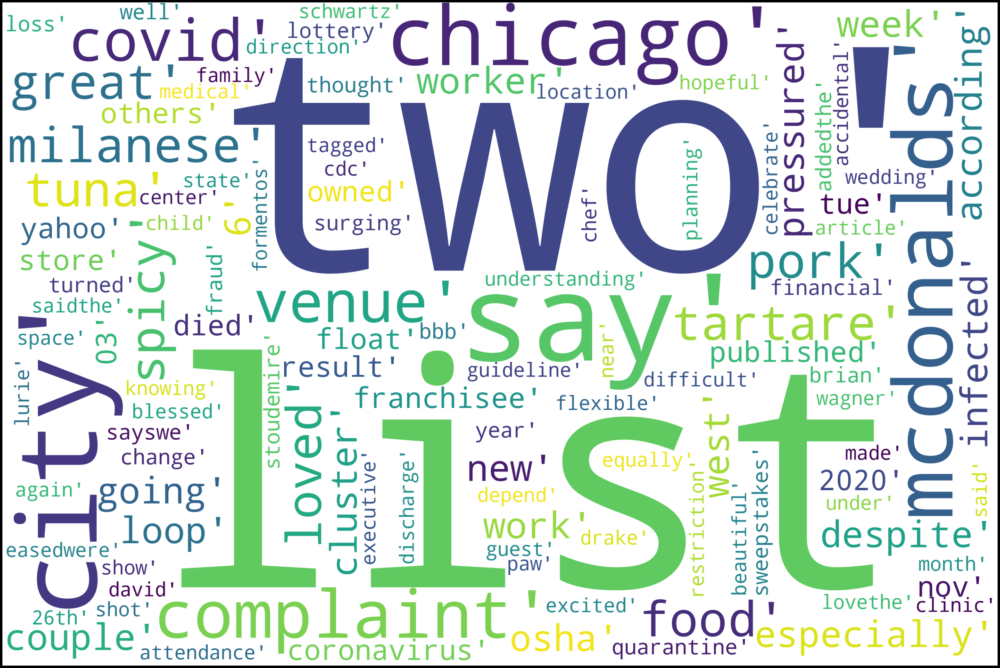

In [203]:
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'white',
    stopwords = STOPWORDS).generate(str(text_org_pos))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

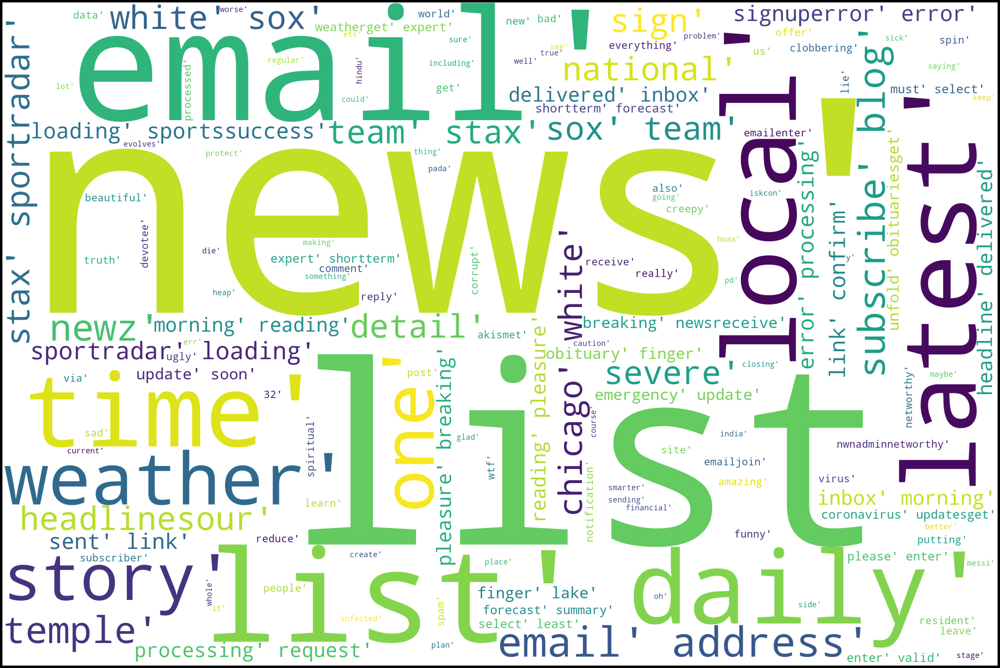

In [204]:
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'white',
    stopwords = STOPWORDS).generate(str(text_org_neg))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

#### People topics

In [172]:
bloblist = []
del bloblist[:]

for i in range(0,len(df)):
    bloblist.append(TextBlob(df_all_per['Text'].iloc[i]))
    
len(bloblist) 

177232

In [173]:
text_list = df_all_per['Text'].tolist()


text_clean = [clean(doc).split() for doc in text_list]

dictionary = corpora.Dictionary(text_clean)

%time doc_term_matrix = [dictionary.doc2bow(doc) for doc in text_clean]


Wall time: 11.9 s


In [174]:
%%time

num_topics = 7
iterations = 100
passes = 20
workers = num_processors-1
eval_every = None

ldamodel = LdaMulticore(corpus=doc_term_matrix,
                       id2word=dictionary,
                       eta='auto',
                       num_topics=num_topics,
                       iterations=iterations,
                       passes=passes,
                       eval_every=eval_every,
                       workers = workers)

Wall time: 16min 42s


In [175]:
print(*ldamodel.print_topics(num_topics=num_topics, num_words=7), sep='\n\n')

(0, '0.091*"illinois" + 0.042*"department" + 0.038*"working" + 0.034*"employee" + 0.030*"public" + 0.024*"pay" + 0.021*"total"')

(1, '0.030*"real" + 0.028*"estate" + 0.027*"may" + 0.026*"broker" + 0.020*"data" + 0.020*"information" + 0.017*"logo"')

(2, '0.023*"point" + 0.021*"2" + 0.020*"illinois" + 0.012*"3" + 0.011*"state" + 0.010*"1" + 0.009*"12"')

(3, '0.020*"chicago" + 0.016*"illinois" + 0.009*"state" + 0.007*"2021" + 0.006*"new" + 0.005*"news" + 0.004*"covid19"')

(4, '0.023*"chicago" + 0.022*"police" + 0.012*"said" + 0.010*"illinois" + 0.009*"shot" + 0.008*"man" + 0.008*"officer"')

(5, '0.007*"high" + 0.007*"like" + 0.007*"chicago" + 0.006*"get" + 0.006*"said" + 0.005*"trump" + 0.005*"low"')

(6, '0.034*"chicago" + 0.009*"game" + 0.008*"season" + 0.007*"bear" + 0.006*"2021" + 0.005*"cub" + 0.005*"first"')


#### People sentiment

In [205]:
ppl_sent = pipe.predict(df_all_per['Text'])
df_all_per['sentiment']=ppl_sent
df_all_per['text_cln'] = [clean(doc).split() for doc in df_all_per.Text.to_list()]

<ipython-input-205-9cce63d1220e>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_all_per['sentiment']=ppl_sent
<ipython-input-205-9cce63d1220e>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_all_per['text_cln'] = [clean(doc).split() for doc in df_all_per.Text.to_list()]


In [206]:
ppl_pos = df_all_per[df_all_per.sentiment == 1]
ppl_neg = df_all_per[df_all_per.sentiment == 0]

text_ppl_pos = ppl_pos.text_cln.values
text_ppl_neg = ppl_neg.text_cln.values

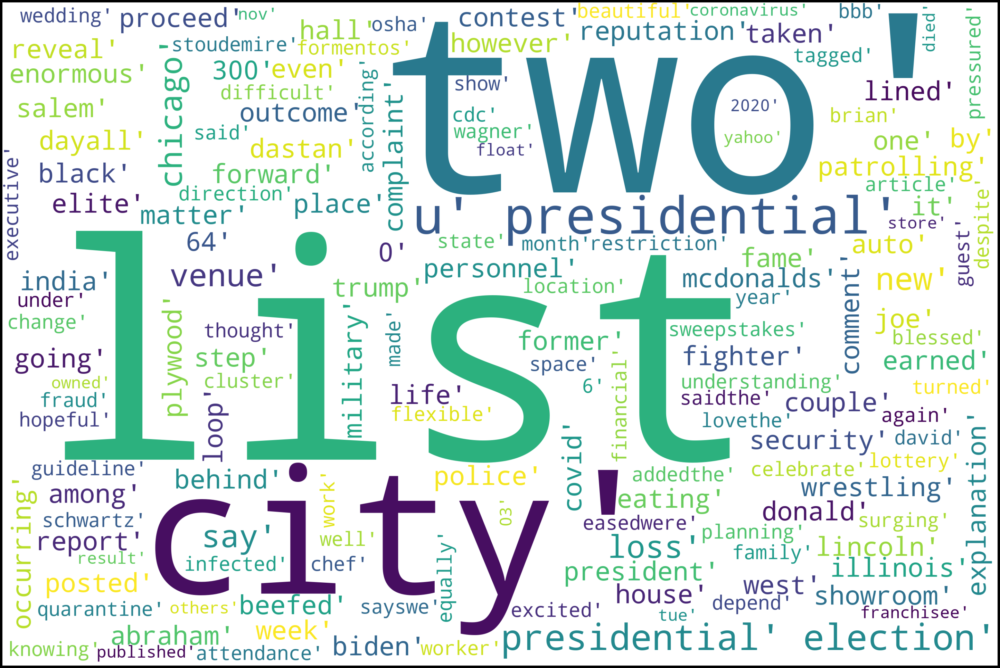

In [207]:
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'white',
    stopwords = STOPWORDS).generate(str(text_ppl_pos))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

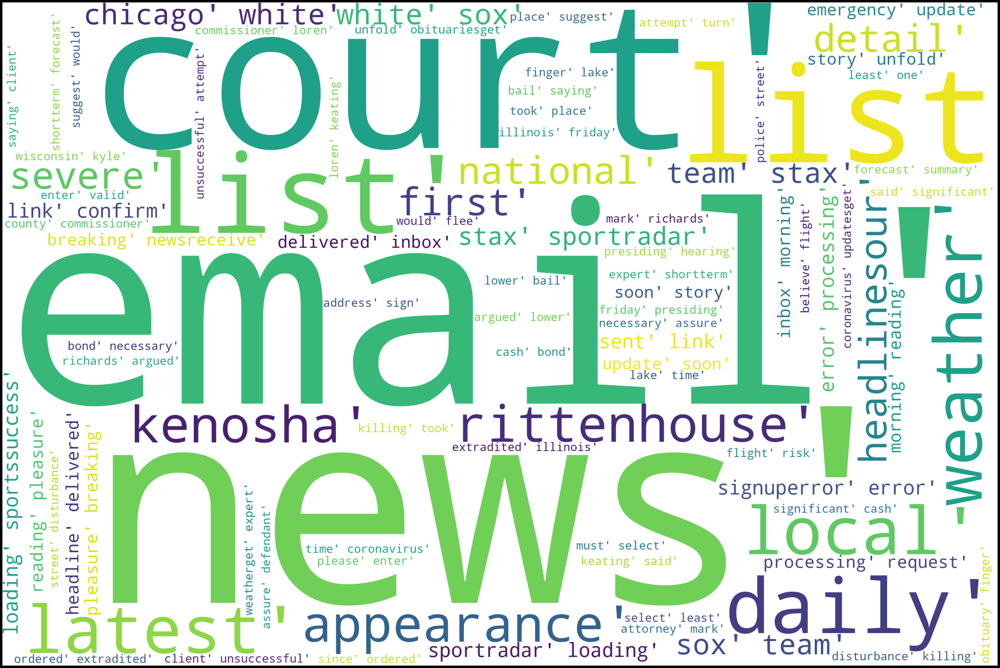

In [208]:
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'white',
    stopwords = STOPWORDS).generate(str(text_ppl_neg))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()